# <center>**STRUCTURING AND IMPORTING THE NECESSARY LIBRARIES**</center>

#### <u>**CONFIGURATION OF PACKAGES AND LIBRARY IMPORTATION**</u>

In [1]:
# Import necessary libraries
import pandas as pd                      # Data manipulation and analysis
import numpy as np                       # Numerical operations
import yfinance as yf                    # Downloading historical market data
import matplotlib.pyplot as plt          # Static and interactive visualizations
import seaborn as sns                    # Statistical data visualization
import plotly.express as px              # Interactive plots and dashboards
import statsmodels.api as sm             # Statistical modeling and hypothesis testing
import tensorflow as tf                  # Building and training neural networks
from sklearn.model_selection import train_test_split  # Splitting data into training and testing sets
from sklearn.ensemble import RandomForestRegressor    # Random Forest algorithm for machine learning
from tensorflow.keras.models import Sequential        # Neural network model
from tensorflow.keras.layers import LSTM, Dense, Dropout  # Layers for neural network
from scipy.optimize import minimize                   # Optimization functions
from flask import Flask, request, jsonify, render_template  # Web application framework
import os                               # Operating system
import glob 
import math                             # Mathematics
import quantstats as qs                 # Quantitative financial analysis
import cvxpy as cp                      # Convex optimization
from mpl_toolkits.mplot3d import Axes3D # 3D graphs

# Random Forest for Machine Learning
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor


from sklearn.model_selection import RandomizedSearchCV


# Neural Networks for Machine Learning
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from scikeras.wrappers import KerasClassifier

# Training and Testing 
from sklearn.model_selection import train_test_split

#Pipelines for Nested Cross-validation
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold

# Metrics Computation
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, auc, roc_auc_score, make_scorer, roc_curve
from sklearn.model_selection import cross_val_predict


# Matplotlib inline for static plots in notebooks
%matplotlib inline

# Pandas display options
pd.set_option('display.max_columns', 8)
pd.set_option('display.width', 1000)

# Extend Pandas with Quantstats
qs.extend_pandas()

# Matplotlib interactive charts
%matplotlib widget

# Seaborn styles
sns.set_theme()


#### <u>**READING HISTORICAL DATA FROM BLOOMBERG**</u>

In [2]:
import pandas as pd

# Define the path to the Excel file
file_name = 'portfolio.xlsx'

# Load all sheets from the Excel file into a dictionary where the key is the sheet name
sheets_dict = pd.read_excel(file_name, sheet_name=None)

# Initialize a list to hold DataFrames
df_list = []

# Iterate through the dictionary, process each sheet
for sheet_name, data in sheets_dict.items():
    # Add a column to each DataFrame to identify the ticker (sheet name)
    data['Ticker'] = sheet_name
    # Append the DataFrame to the list
    df_list.append(data)

# Concatenate all DataFrames into a single DataFrame
consolidated_data = pd.concat(df_list, ignore_index=True)

# Display the basic information about the combined DataFrame
print("Consolidated DataFrame Info:")
consolidated_data.info()

# Print the first few rows of the combined DataFrame
print("First few rows of the Consolidated DataFrame:")
print(consolidated_data.head(10))


Consolidated DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43625 entries, 0 to 43624
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Dates       22649 non-null  datetime64[ns]
 1   Last Price  43625 non-null  float64       
 2   Open Price  42063 non-null  float64       
 3   Low Price   42063 non-null  float64       
 4   High Price  42063 non-null  float64       
 5   Volume      41282 non-null  float64       
 6   Ticker      43625 non-null  object        
 7   Dates       20976 non-null  datetime64[ns]
dtypes: datetime64[ns](2), float64(5), object(1)
memory usage: 2.7+ MB
First few rows of the Consolidated DataFrame:
      Dates   Last Price  Open Price  Low Price  High Price       Volume          Ticker Dates
0 2021-01-01      132.69      134.08    131.720     134.740   99116586.0  AAPL US EQUITY   NaT
1 2021-01-04      129.41      133.52    126.760     133.612  143301887.0  AA

#### <u>**CHECKING FOR TICKERS**</u>

In [3]:
# Display unique tickers from the 'Ticker' column
unique_tickers = consolidated_data['Ticker'].unique()
print("Unique Tickers in the Consolidated DataFrame:")
print(unique_tickers)

Unique Tickers in the Consolidated DataFrame:
['AAPL US EQUITY' 'IBM US EQUITY' 'VOD LN EQUITY' 'MSFT US EQUITY' 'GOOGL'
 'AMZN US EQUITY' 'VRSN US EQUITY' 'INTU US EQUITY' 'ADBE US EQUITY'
 'TLSA US EQUITY' 'CSCO US EQUITY' 'PYPL US EQUITY' 'MDLZ US EQUITY'
 'GILD US EQUITY' 'MRNA US EQUITY' 'REGN US EQUITY' 'JPM US EQUITY'
 'GS US EQUITY' 'V US EQUITY' 'AXP US EQUITY' 'LLOY LN EQUITY'
 'STAN LN EQUITY' 'SDR LN EQUITY' 'HL-LN EQUITY' 'LSEG LN EQUITY'
 'BATS LN EQUITY' 'ULVR LN EQUITY' 'TSCO LN EQUITY' 'SBRY LN EQUITY'
 'MKS LN EQUITY' 'BA US EQUITY' 'DTE GY EQUITY' 'TTE FP EQUITY'
 'ABI BB EQUITY' 'NOKIA FP EQUITY' 'BNP FP EQUITY' 'SAN FP EQUITY'
 'ALV GR EQUITY' 'EXPN LN EQUITY' 'ITRK LN EQUITY' 'EZJ LN EQUITY'
 'AUTO LN EQUITY' 'SGRO LN EQUITY' 'UTG LN EQUITY' 'LAND LN EQUITY'
 'UKX INDEX' 'SPX INDEX' 'SX5E INDEX' 'NKY INDEX ' 'HSI INDEX'
 'BND US EQUITY' 'BNDX US EQUITY' 'GDBR2 INDEX' 'UKAB3YAC INDEX'
 'UKAB10BC INDEX' 'VTI US EQUITY']


#### <u>**CHECKING AND UPDATING THE DATAFRAME**</u>

In [4]:
# Check current column names to identify date columns
print("Current columns in DataFrame:")
print(consolidated_data.columns)

# If the date columns are still named differently or contain spaces, rename them appropriately
# Identify possible date columns
possible_date_columns = [col for col in consolidated_data.columns if 'date' in col.lower()]

print("Possible date columns identified:", possible_date_columns)

# Assuming we find 'Dates' and 'Dates ' as our relevant date columns
# Consolidate these columns
if 'Dates' in possible_date_columns and 'Dates ' in possible_date_columns:
    consolidated_data['Dates'] = consolidated_data['Dates'].fillna(consolidated_data['Dates '])
    consolidated_data.drop(columns=['Dates '], inplace=True, errors='ignore')

# Ensure 'Dates' column is in datetime format
consolidated_data['Dates'] = pd.to_datetime(consolidated_data['Dates'], errors='coerce')


# Verify the changes
print("Updated DataFrame Info:")
consolidated_data.info()
print(consolidated_data.head())

# Assuming 'cleaned_data' is your original DataFrame
consolidated_data_copy1 = consolidated_data.copy()

consolidated_data_copy1.to_csv('DIRECTORY.PORTFOLIO-OPTIMISATION/consolidated_copy1.csv', index=False)
consolidated_data_copy1.to_excel('DIRECTORY.PORTFOLIO-OPTIMISATION/consolidated_data_copy1.xlsx', index=False)


Current columns in DataFrame:
Index(['Dates ', 'Last Price', 'Open Price', 'Low Price', 'High Price', 'Volume', 'Ticker', 'Dates'], dtype='object')
Possible date columns identified: ['Dates ', 'Dates']
Updated DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43625 entries, 0 to 43624
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Last Price  43625 non-null  float64       
 1   Open Price  42063 non-null  float64       
 2   Low Price   42063 non-null  float64       
 3   High Price  42063 non-null  float64       
 4   Volume      41282 non-null  float64       
 5   Ticker      43625 non-null  object        
 6   Dates       43625 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(5), object(1)
memory usage: 2.3+ MB
   Last Price  Open Price  Low Price  High Price       Volume          Ticker      Dates
0      132.69      134.08    131.720     134.740   99116586.0  AAPL US EQU

#### <u>**CHECKING FOR NULL VALUES**</u>

In [5]:
# Check for null values in 'Dates' column
null_dates_count = consolidated_data['Dates'].isnull().sum()
print(f"Null Dates Count: {null_dates_count}")

# Display the min and max dates to ensure they cover the expected period
print("Date Range Start:", consolidated_data['Dates'].min())
print("Date Range End:", consolidated_data['Dates'].max())

# Check for null values in all columns
null_values = consolidated_data.isnull().sum()
print("Null values in each column:")
print(null_values)


Null Dates Count: 0
Date Range Start: 2021-01-01 00:00:00
Date Range End: 2023-12-29 00:00:00
Null values in each column:
Last Price       0
Open Price    1562
Low Price     1562
High Price    1562
Volume        2343
Ticker           0
Dates            0
dtype: int64


#### <u>**FIXING NULL VALUES AND SAVING DATAFRAME**</u>

In [6]:
import pandas as pd

# Assuming consolidated_data is already loaded

# Step 1: Keep only the relevant columns
relevant_columns = ['Dates', 'Last Price', 'Volume', 'Ticker']
consolidated_data = consolidated_data[relevant_columns]

# Step 2: Ensure 'Dates' is the first column (already done by selecting in the right order)

# Step 3: Handle missing values with forward fill
consolidated_data['Last Price'].fillna(method='ffill', inplace=True)
consolidated_data['Volume'].fillna(method='ffill', inplace=True)

# Optionally, if you prefer to use backward fill instead, use the following lines:
# consolidated_data['Last Price'].fillna(method='bfill', inplace=True)
# consolidated_data['Volume'].fillna(method='bfill', inplace=True)

# Check for any remaining missing values
print("Null values after filling:")
print(consolidated_data.isnull().sum())

# Step 4: Sort the DataFrame by 'Dates' and 'Ticker'
consolidated_data = consolidated_data.sort_values(by=['Dates', 'Ticker'])

# Step 5: Save the cleaned DataFrame to a new CSV file
cleaned_file_path = 'cleaned_portfolio_data.csv'
consolidated_data.to_csv(cleaned_file_path, index=False)

print(f"Cleaned data saved to {cleaned_file_path}")


Null values after filling:
Dates         0
Last Price    0
Volume        0
Ticker        0
dtype: int64
Cleaned data saved to cleaned_portfolio_data.csv


# <center>**DATA EXPLORATORY ANALYSIS**</center>

#### <u>**RELOAD CLEANED DATA**</u>

In [7]:
import pandas as pd

# Load the cleaned data from the CSV file
cleaned_data = pd.read_csv('cleaned_portfolio_data.csv')

# Convert the 'Dates' column to datetime format
cleaned_data['Dates'] = pd.to_datetime(cleaned_data['Dates'])

# Display the first few rows to ensure data is loaded correctly
print("First few rows of the cleaned data:")
print(cleaned_data.head())

# Display basic information about the DataFrame
print("\nDataFrame Info:")
cleaned_data.info()

# Check for any remaining null values
print("\nNull values in each column:")
print(cleaned_data.isnull().sum())

# Assuming 'cleaned_data' is your original DataFrame
data_copy1_data_exploratory_analysis = cleaned_data.copy()

data_copy1_data_exploratory_analysis.to_csv('DIRECTORY.PORTFOLIO-OPTIMISATION/data_copy1.csv', index=False)
data_copy1_data_exploratory_analysis.to_excel('DIRECTORY.PORTFOLIO-OPTIMISATION/ata_copy1.xlsx', index=False)

First few rows of the cleaned data:
       Dates  Last Price      Volume          Ticker
0 2021-01-01     132.690  99116586.0  AAPL US EQUITY
1 2021-01-01      57.010    389502.0   ABI BB EQUITY
2 2021-01-01     500.120   1462236.0  ADBE US EQUITY
3 2021-01-01     200.700    545156.0   ALV GR EQUITY
4 2021-01-01     162.847  59144120.0  AMZN US EQUITY

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43625 entries, 0 to 43624
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Dates       43625 non-null  datetime64[ns]
 1   Last Price  43625 non-null  float64       
 2   Volume      43625 non-null  float64       
 3   Ticker      43625 non-null  object        
dtypes: datetime64[ns](1), float64(2), object(1)
memory usage: 1.3+ MB

Null values in each column:
Dates         0
Last Price    0
Volume        0
Ticker        0
dtype: int64


#### <u>**GENERATE SUMMARY STATISTICS FOR THE DATAFRAME**</u>

In [8]:
import pandas as pd

# Display basic information about the DataFrame
print("DataFrame Info:")
cleaned_data.info()

# Generate summary statistics for the numerical columns
print("\nSummary Statistics:")
cleaned_data.describe()

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43625 entries, 0 to 43624
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Dates       43625 non-null  datetime64[ns]
 1   Last Price  43625 non-null  float64       
 2   Volume      43625 non-null  float64       
 3   Ticker      43625 non-null  object        
dtypes: datetime64[ns](1), float64(2), object(1)
memory usage: 1.3+ MB

Summary Statistics:


,Dates,Last Price,Volume
count,43625,43625.000000,4.362500e+04
mean,2022-07-01 19:11:34.253295104,1869.443771,9.767448e+07
min,2021-01-01 00:00:00,-0.781000,3.400000e+02
25%,2021-10-01 00:00:00,86.340000,1.740879e+06
50%,2022-07-01 00:00:00,225.270000,4.316974e+06
75%,2023-03-31 00:00:00,782.000000,1.494285e+07
max,2023-12-29 00:00:00,33753.330000,6.012760e+09
std,NaN,4967.734260,3.613598e+08


#### <u>**PLOT TIMESERIES GRAPH FOR SELECTED TICKERS**</u>

In [9]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Select a few tickers to plot
selected_tickers = ['TLSA US EQUITY', 'STAN LN EQUITY', 'SAN FP EQUITY', 'ALV GR EQUITY']

# Create a subplot with 2 rows, one for 'Last Price' and one for 'Volume', with minimal vertical spacing
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, 
                    vertical_spacing=0.02,  # Reduced vertical spacing
                    subplot_titles=('Last Price', ''))  # Empty title for the second plot

# Add traces for 'Last Price'
for ticker in selected_tickers:
    ticker_data = cleaned_data[cleaned_data['Ticker'] == ticker]
    fig.add_trace(go.Scatter(x=ticker_data['Dates'], y=ticker_data['Last Price'], 
                             mode='lines', name=f'{ticker} - Last Price'),
                  row=1, col=1)

# Add traces for 'Volume'
for ticker in selected_tickers:
    ticker_data = cleaned_data[cleaned_data['Ticker'] == ticker]
    fig.add_trace(go.Scatter(x=ticker_data['Dates'], y=ticker_data['Volume'], 
                             mode='lines', name=f'{ticker} - Volume', opacity=0.6),
                  row=2, col=1)

# Update layout
fig.update_layout(
    title='PLOT FOR DIFFERENT SECURITIES FOR A PORTFOLIO BASED ON SELECTED TICKERS',
    height=800,
    width=1200,
    hovermode='x unified',
    plot_bgcolor='white',
    paper_bgcolor='white',
    xaxis=dict(
        showgrid=True,
        gridcolor='lightgray'
    ),
    xaxis2=dict(
        showgrid=True,
        gridcolor='lightgray'
    ),
    yaxis=dict(
        title='Last Price',
        showgrid=True,
        gridcolor='lightgray'
    ),
    yaxis2=dict(
        title='Volume',
        showgrid=True,
        gridcolor='lightgray'
    )
)

# Show the plot
fig.show()


In [10]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Select a few tickers to plot
selected_tickers = ['AAPL US EQUITY', 'GOOGL', 'MSFT US EQUITY', 'AMZN US EQUITY']

# Create a subplot with 2 rows, one for 'Last Price' and one for 'Volume', with minimal vertical spacing
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, 
                    vertical_spacing=0.02,  # Reduced vertical spacing
                    subplot_titles=('Last Price', ''))  # Empty title for the second plot

# Add traces for 'Last Price'
for ticker in selected_tickers:
    ticker_data = cleaned_data[cleaned_data['Ticker'] == ticker]
    fig.add_trace(go.Scatter(x=ticker_data['Dates'], y=ticker_data['Last Price'], 
                             mode='lines', name=f'{ticker} - Last Price'),
                  row=1, col=1)

# Add traces for 'Volume'
for ticker in selected_tickers:
    ticker_data = cleaned_data[cleaned_data['Ticker'] == ticker]
    fig.add_trace(go.Scatter(x=ticker_data['Dates'], y=ticker_data['Volume'], 
                             mode='lines', name=f'{ticker} - Volume', opacity=0.6),
                  row=2, col=1)

# Update layout
fig.update_layout(
    title='PLOT FOR US-ONLY SECURITIES FOR A PORTFOLIO BASED ON SELECTED TICKERS',
    height=800,
    width=1200,
    hovermode='x unified',
    plot_bgcolor='white',
    paper_bgcolor='white',
    xaxis=dict(
        showgrid=True,
        gridcolor='lightgray'
    ),
    xaxis2=dict(
        showgrid=True,
        gridcolor='lightgray'
    ),
    yaxis=dict(
        title='Last Price',
        showgrid=True,
        gridcolor='lightgray'
    ),
    yaxis2=dict(
        title='Volume',
        showgrid=True,
        gridcolor='lightgray'
    )
)

# Show the plot
fig.show()


In [11]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Select a few tickers to plot
selected_tickers = ['ABI BB EQUITY', 'NOKIA FP EQUITY', 'BNP FP EQUITY', 'SAN FP EQUITY']

# Create a subplot with 2 rows, one for 'Last Price' and one for 'Volume', with minimal vertical spacing
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, 
                    vertical_spacing=0.02,  # Reduced vertical spacing
                    subplot_titles=('Last Price', ''))  # Empty title for the second plot

# Add traces for 'Last Price'
for ticker in selected_tickers:
    ticker_data = cleaned_data[cleaned_data['Ticker'] == ticker]
    fig.add_trace(go.Scatter(x=ticker_data['Dates'], y=ticker_data['Last Price'], 
                             mode='lines', name=f'{ticker} - Last Price'),
                  row=1, col=1)

# Add traces for 'Volume'
for ticker in selected_tickers:
    ticker_data = cleaned_data[cleaned_data['Ticker'] == ticker]
    fig.add_trace(go.Scatter(x=ticker_data['Dates'], y=ticker_data['Volume'], 
                             mode='lines', name=f'{ticker} - Volume', opacity=0.6),
                  row=2, col=1)

# Update layout
fig.update_layout(
    title='PLOT FOR EUROPE-ONLY SECURITIES FOR A PORTFOLIO BASED ON SELECTED TICKERS',
    height=800,
    width=1200,
    hovermode='x unified',
    plot_bgcolor='white',
    paper_bgcolor='white',
    xaxis=dict(
        showgrid=True,
        gridcolor='lightgray'
    ),
    xaxis2=dict(
        showgrid=True,
        gridcolor='lightgray'
    ),
    yaxis=dict(
        title='Last Price',
        showgrid=True,
        gridcolor='lightgray'
    ),
    yaxis2=dict(
        title='Volume',
        showgrid=True,
        gridcolor='lightgray'
    )
)

# Show the plot
fig.show()


In [12]:
import plotly.express as px

# Filter data for selected tickers
selected_tickers = ['AAPL US EQUITY', 'GOOGL', 'MSFT US EQUITY', 'AMZN US EQUITY']

# Create a histogram for the Last Price of selected tickers
fig = px.histogram(cleaned_data[cleaned_data['Ticker'].isin(selected_tickers)], 
                   x='Last Price', 
                   color='Ticker',
                   barmode='group',  # Group the histograms for clearer comparison
                   nbins=50,  # Number of bins can be adjusted depending on data spread
                   title='Distribution of Last Prices for Selected Tickers',
                   height=1000  # Increase the height of the graph
)

# Update layout for better visualization
fig.update_layout(
    xaxis_title="Last Price",
    yaxis_title="Count",
    plot_bgcolor='white',
    paper_bgcolor='white',
    legend_title_text='Ticker'
)

# Show the plot
fig.show()


In [13]:
import plotly.express as px

# Aggregate total trading volume by ticker
volume_by_ticker = cleaned_data.groupby('Ticker')['Volume'].sum().reset_index()

# Create a vertical bar chart for trading volume
fig = px.bar(volume_by_ticker, 
             x='Ticker', 
             y='Volume', 
             title='Total Trading Volume by Ticker',
             text='Volume')  # Optionally add volume numbers on top of each bar

# Update layout
fig.update_layout(
    xaxis_title="Ticker",
    yaxis_title="Total Volume",
    plot_bgcolor='white',
    paper_bgcolor='white',
    xaxis={'categoryorder':'total descending'},  # Sort bars by descending order of volume
    xaxis_tickangle=-45,  # Rotate the tick labels for better visibility
    height=1000  # Increase the height of the graph
)

# Show the plot
fig.show()


In [14]:
# Pivot the data to have dates as rows and tickers as columns for Last Price
price_data = cleaned_data.pivot(index='Dates', columns='Ticker', values='Last Price')

# Calculate the correlation matrix for Last Prices across different tickers
correlation_matrix = price_data.corr()
print(correlation_matrix)


Ticker           AAPL US EQUITY  ABI BB EQUITY  ADBE US EQUITY  ALV GR EQUITY  ...  V US EQUITY  VOD LN EQUITY  VRSN US EQUITY  VTI US EQUITY
Ticker                                                                         ...                                                           
AAPL US EQUITY         1.000000      -0.119119        0.246234       0.354940  ...     0.462927      -0.635578        0.308940       0.445948
ABI BB EQUITY         -0.119119       1.000000        0.016201       0.555058  ...     0.392969       0.088137        0.333620       0.093638
ADBE US EQUITY         0.246234       0.016201        1.000000       0.339491  ...     0.541143       0.024776        0.588323       0.870284
ALV GR EQUITY          0.354940       0.555058        0.339491       1.000000  ...     0.741325      -0.338393        0.481203       0.455904
AMZN US EQUITY        -0.030614       0.046927        0.815589       0.128664  ...     0.246662       0.456101        0.518101       0.740302
AUTO L

In [15]:
import plotly.express as px

# Create a heatmap for the correlation matrix
fig = px.imshow(correlation_matrix,
                text_auto=True,  # Automatically add text on each cell with the correlation value
                labels=dict(x="Ticker", y="Ticker", color="Correlation"),
                title="Correlation Heatmap of Last Prices Across Tickers",
                aspect='auto')  # Adjust aspect ratio for better space utilization

# Update layout to make it more readable
fig.update_layout(
    plot_bgcolor='white',
    paper_bgcolor='white',
    xaxis=dict(tickmode='linear', tickangle=-45, tickfont=dict(size=10)),
    yaxis=dict(tickmode='linear', tickfont=dict(size=10)),
    autosize=True,
    height=1500,  # Increased height for better clarity
    width=1200,   # Matching width for square cells
    margin=dict(t=100, b=20, l=10, r=10)  # Adjust margins to fit labels
)

# Add a color scale for better visual interpretation
fig.update_traces(showscale=True)

# Show the plot
fig.show()


In [16]:
import plotly.graph_objects as go
from statsmodels.tsa.seasonal import seasonal_decompose

# Example tickers selection
tickers = ['AAPL US EQUITY', 'HSI INDEX', 'NKY INDEX ', 'GOOGL', 'VOD LN EQUITY']

# Create a figure with subplots
fig = make_subplots(rows=len(tickers), cols=4, 
                    subplot_titles=[f"{ticker} - {comp}" for ticker in tickers for comp in ['Original', 'Trend', 'Seasonal', 'Residual']],
                    vertical_spacing=0.05)

# Loop through each ticker and perform decomposition
for i, ticker in enumerate(tickers, start=1):
    # Prepare data
    data = cleaned_data[cleaned_data['Ticker'] == ticker].set_index('Dates')['Last Price'].asfreq('B')
    data.fillna(method='ffill', inplace=True)  # Forward fill missing values
    
    # Decompose
    decomposition = seasonal_decompose(data, model='additive', period=30)  # Adjust the period based on data frequency

    # Add traces for each component
    fig.add_trace(go.Scatter(x=data.index, y=data, name=f'{ticker} Original'), row=i, col=1)
    fig.add_trace(go.Scatter(x=decomposition.trend.index, y=decomposition.trend, name=f'{ticker} Trend'), row=i, col=2)
    fig.add_trace(go.Scatter(x=decomposition.seasonal.index, y=decomposition.seasonal, name=f'{ticker} Seasonal'), row=i, col=3)
    fig.add_trace(go.Scatter(x=decomposition.resid.index, y=decomposition.resid, name=f'{ticker} Residual'), row=i, col=4)

# Update layout
fig.update_layout(height=1500, width=1200, title_text="Decomposition of Multiple Tickers by Region",
                  showlegend=False)

# Show the plot
fig.show()


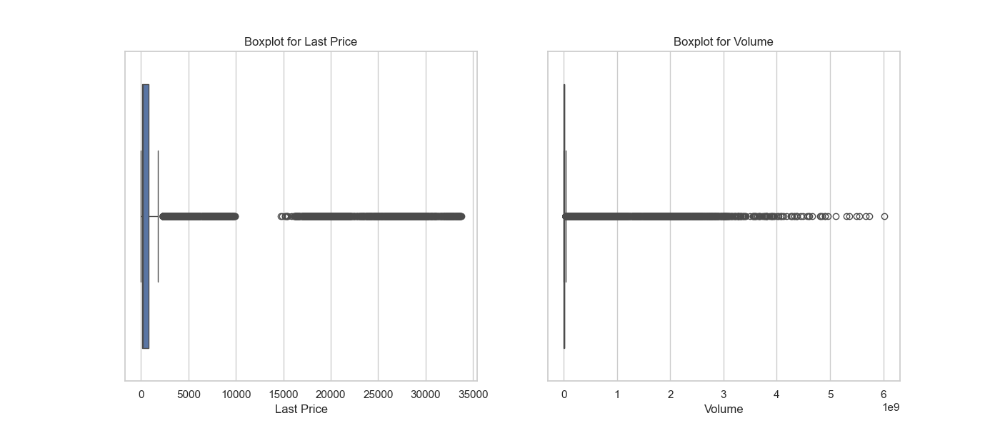

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the aesthetic style of the plots
sns.set(style="whitegrid")

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Generate a boxplot for the 'Last Price'
sns.boxplot(ax=axes[0], data=cleaned_data, x='Last Price')
axes[0].set_title('Boxplot for Last Price')

# Generate a boxplot for the 'Volume'
sns.boxplot(ax=axes[1], data=cleaned_data, x='Volume')
axes[1].set_title('Boxplot for Volume')

plt.show()


In [18]:
from scipy import stats

# Calculate Z-scores for 'Last Price' and 'Volume'
cleaned_data['Z_score_Last_Price'] = stats.zscore(cleaned_data['Last Price'])
cleaned_data['Z_score_Volume'] = stats.zscore(cleaned_data['Volume'])

# Filter entries where the absolute Z-score is greater than 3
outliers_last_price = cleaned_data[cleaned_data['Z_score_Last_Price'].abs() > 3]
outliers_volume = cleaned_data[cleaned_data['Z_score_Volume'].abs() > 3]

print("Outliers in Last Price:")
print(outliers_last_price[['Dates', 'Last Price', 'Z_score_Last_Price']])

print("\nOutliers in Volume:")
print(outliers_volume[['Dates', 'Volume', 'Z_score_Volume']])


Outliers in Last Price:
           Dates  Last Price  Z_score_Last_Price
19    2021-01-01    27231.13            5.105341
30    2021-01-01    27444.17            5.148226
73    2021-01-04    27472.81            5.153991
85    2021-01-04    27258.38            5.110826
129   2021-01-05    27649.86            5.189632
...          ...         ...                 ...
43490 2023-12-27    33681.24            6.403757
43534 2023-12-28    17043.53            3.054564
43546 2023-12-28    33539.62            6.375248
43590 2023-12-29    17047.39            3.055341
43602 2023-12-29    33464.17            6.360060

[1524 rows x 3 columns]

Outliers in Volume:
           Dates        Volume  Z_score_Volume
19    2021-01-01  2.054705e+09        5.415802
73    2021-01-04  2.870443e+09        7.673240
129   2021-01-05  3.282490e+09        8.813520
185   2021-01-06  3.079383e+09        8.251449
213   2021-01-06  1.187304e+09        3.015393
...          ...           ...             ...
43369 2023-12

In [19]:
from statsmodels.tsa.stattools import adfuller

def adf_test(series, title=''):
    result = adfuller(series.dropna())  # Handling missing values if necessary
    print(f'\nADF Statistic for {title}: {result[0]}')
    print(f'p-value: {result[1]}')
    if result[1] < 0.05:
        print("Reject the null hypothesis. Data is stationary")
    else:
        print("Fail to reject the null hypothesis. Data is non-stationary")

# Apply ADF test to each ticker for 'Last Price' and 'Volume'
for ticker in tickers:
    ticker_data = cleaned_data[cleaned_data['Ticker'] == ticker]
    adf_test(ticker_data['Last Price'], f'{ticker} Last Price')
    adf_test(ticker_data['Volume'], f'{ticker} Volume')



ADF Statistic for AAPL US EQUITY Last Price: -1.561208110235126
p-value: 0.5030449663094321
Fail to reject the null hypothesis. Data is non-stationary

ADF Statistic for AAPL US EQUITY Volume: -4.200179823990543
p-value: 0.0006584385360941034
Reject the null hypothesis. Data is stationary

ADF Statistic for HSI INDEX Last Price: -1.1100836527513145
p-value: 0.7110339541635611
Fail to reject the null hypothesis. Data is non-stationary

ADF Statistic for HSI INDEX Volume: -7.675965724948505
p-value: 1.548586776958514e-11
Reject the null hypothesis. Data is stationary

ADF Statistic for NKY INDEX  Last Price: -1.676639495861908
p-value: 0.44318691301021634
Fail to reject the null hypothesis. Data is non-stationary

ADF Statistic for NKY INDEX  Volume: -5.9945443529549305
p-value: 1.7139709250533133e-07
Reject the null hypothesis. Data is stationary

ADF Statistic for GOOGL Last Price: -2.0836348022297284
p-value: 0.2511458411107097
Fail to reject the null hypothesis. Data is non-stationa

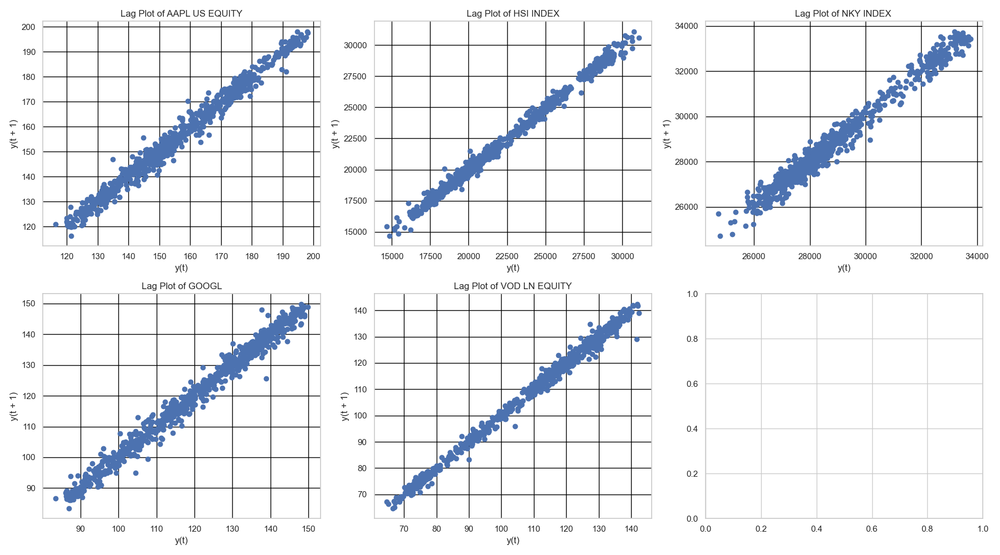

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
from pandas.plotting import lag_plot

# Define the selected tickers for lag analysis
selected_tickers = ['AAPL US EQUITY', 'HSI INDEX', 'NKY INDEX ', 'GOOGL', 'VOD LN EQUITY']

# Create a figure to hold the plots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))  # Adjusted for 5 tickers
axes = axes.flatten()  # Flatten the array for easier iteration

# Loop through the selected tickers and create lag plots
for i, ticker in enumerate(selected_tickers):
    ticker_data = cleaned_data[cleaned_data['Ticker'] == ticker]
    if not ticker_data.empty:
        lag_plot(ticker_data['Last Price'], ax=axes[i])
        axes[i].set_title(f'Lag Plot of {ticker}')
        axes[i].set_facecolor('white')  # Set the background color to white
        axes[i].grid(True, color='black')  # Set the grid color to black
    else:
        axes[i].set_visible(False)  # Hide axes if no data

# Adjust layout and display the plot
plt.tight_layout()
plt.show()


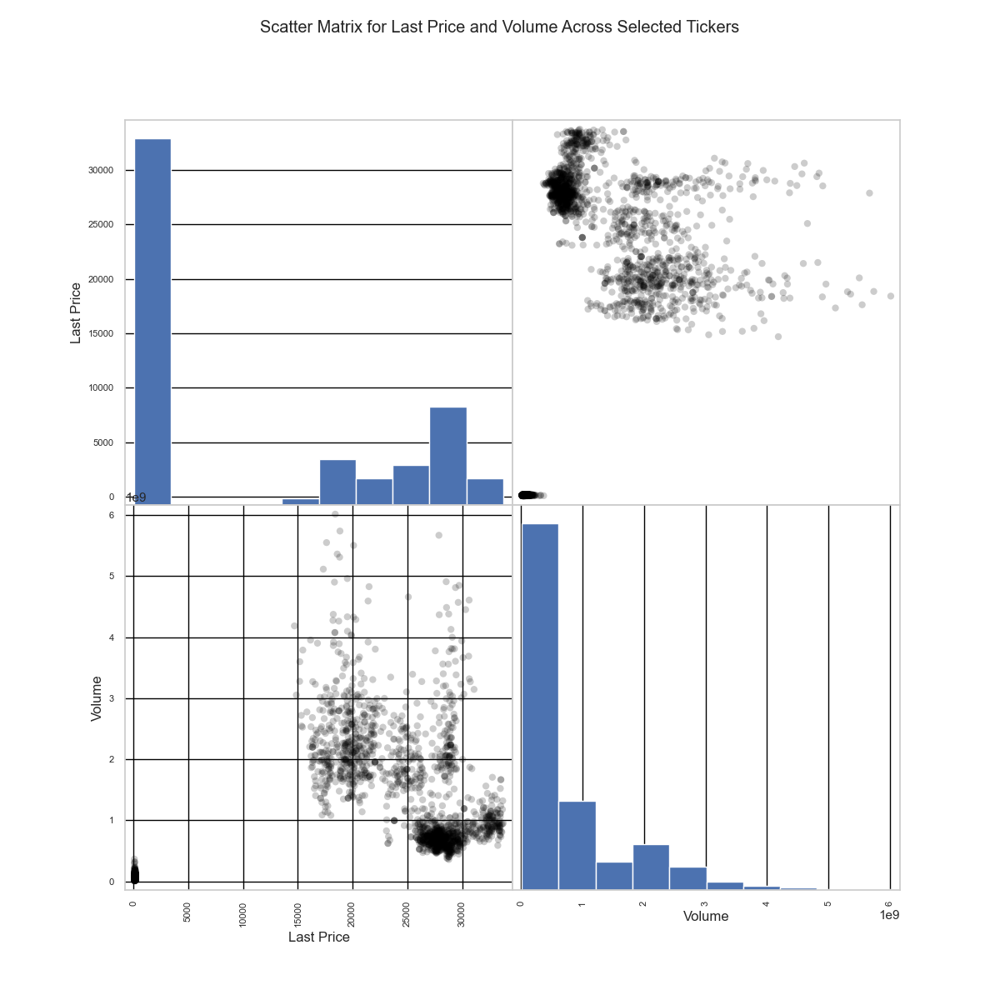

In [21]:
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt

# Define the selected tickers for analysis
selected_tickers = ['AAPL US EQUITY', 'HSI INDEX', 'NKY INDEX ', 'GOOGL', 'VOD LN EQUITY']

# Selecting data for the scatter matrix
features = ['Last Price', 'Volume']

# Filter data for selected tickers
filtered_data = cleaned_data[cleaned_data['Ticker'].isin(selected_tickers)]

# Generate the scatter matrix
scatter_matrix(filtered_data[features], alpha=0.2, figsize=(12, 12), diagonal='hist', marker='o', color='black', grid=True)

# Set background color to white
plt.gcf().patch.set_facecolor('white')

# Set grid color to black
for ax in plt.gcf().axes:
    ax.set_facecolor('white')
    ax.grid(color='black')

plt.suptitle('Scatter Matrix for Last Price and Volume Across Selected Tickers')
plt.show()


# <center>**MARKET TREND ANALYSIS USING Bi-LSTM MODEL**</center>

#### <u>**HANDLING OUTLIERS**</u>

In [22]:
def handle_outliers(data, feature):
    Q1 = data[feature].quantile(0.25)
    Q3 = data[feature].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Cap the outliers
    data[feature] = np.where(data[feature] > upper_bound, upper_bound, data[feature])
    data[feature] = np.where(data[feature] < lower_bound, lower_bound, data[feature])
    return data

# Apply the function to each feature with potential outliers
for feature in ['Last Price', 'Volume']:
    cleaned_data = handle_outliers(cleaned_data, feature)


#### <u>**ENSURING STATIONARITY**</center>

In [23]:
import pandas as pd

# Define the RSI calculation function
def calculate_rsi(data, window=14):
    delta = data['Last Price'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=window).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=window).mean()
    rs = gain / loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

# Initialize a list to store the RSI values
rsi_list = []

# Calculate RSI for each ticker
for ticker in cleaned_data['Ticker'].unique():
    ticker_data = cleaned_data[cleaned_data['Ticker'] == ticker]
    rsi = calculate_rsi(ticker_data)
    rsi_list.extend(rsi)

# Add the RSI values to the cleaned_data DataFrame
cleaned_data['RSI'] = rsi_list

# Display the first few rows of the updated DataFrame
print(cleaned_data[['Dates', 'Last Price', 'Volume', 'Ticker', 'RSI']].head(20))


        Dates  Last Price      Volume          Ticker        RSI
0  2021-01-01     132.690  34745816.5  AAPL US EQUITY        NaN
1  2021-01-01      57.010    389502.0   ABI BB EQUITY        NaN
2  2021-01-01     500.120   1462236.0  ADBE US EQUITY        NaN
3  2021-01-01     200.700    545156.0   ALV GR EQUITY        NaN
4  2021-01-01     162.847  34745816.5  AMZN US EQUITY        NaN
5  2021-01-01     596.000    781660.0  AUTO LN EQUITY        NaN
6  2021-01-01     214.060  10487567.0    BA US EQUITY        NaN
7  2021-01-01    1825.490   1391542.0  BATS LN EQUITY        NaN
8  2021-01-01      88.190   6134914.0   BND US EQUITY        NaN
9  2021-01-01      58.550   2864678.0  BNDX US EQUITY        NaN
10 2021-01-01      43.105    827264.0   BNP FP EQUITY        NaN
11 2021-01-01      44.750  15105475.0  CSCO US EQUITY        NaN
12 2021-01-01      14.955   3800644.0   DTE GY EQUITY        NaN
13 2021-01-01    1825.490    526596.0  EXPN LN EQUITY  48.850975
14 2021-01-01     698.788

In [24]:
#### <u>**CALCULATION FOR MACD**</center>

In [25]:
# Define the MACD calculation function
def calculate_macd(data, short_window=12, long_window=26, signal_window=9):
    short_ema = data['Last Price'].ewm(span=short_window, adjust=False).mean()
    long_ema = data['Last Price'].ewm(span=long_window, adjust=False).mean()
    macd = short_ema - long_ema
    signal = macd.ewm(span=signal_window, adjust=False).mean()
    macd_hist = macd - signal
    return macd, signal, macd_hist

# Initialize lists to store the MACD values
macd_list = []
signal_list = []
hist_list = []

# Calculate MACD for each ticker
for ticker in cleaned_data['Ticker'].unique():
    ticker_data = cleaned_data[cleaned_data['Ticker'] == ticker]
    macd, signal, hist = calculate_macd(ticker_data)
    macd_list.extend(macd)
    signal_list.extend(signal)
    hist_list.extend(hist)

# Add the MACD values to the cleaned_data DataFrame
cleaned_data['MACD'] = macd_list
cleaned_data['MACD_Signal'] = signal_list
cleaned_data['MACD_Hist'] = hist_list

# Display the first few rows of the updated DataFrame
print(cleaned_data[['Dates', 'Last Price', 'Volume', 'Ticker', 'MACD', 'MACD_Signal', 'MACD_Hist']].head(20))


        Dates  Last Price      Volume          Ticker      MACD  MACD_Signal  MACD_Hist
0  2021-01-01     132.690  34745816.5  AAPL US EQUITY  0.000000     0.000000   0.000000
1  2021-01-01      57.010    389502.0   ABI BB EQUITY -0.261652    -0.052330  -0.209322
2  2021-01-01     500.120   1462236.0  ADBE US EQUITY -0.336034    -0.109071  -0.226963
3  2021-01-01     200.700    545156.0   ALV GR EQUITY -0.742275    -0.235712  -0.506563
4  2021-01-01     162.847  34745816.5  AMZN US EQUITY -0.707481    -0.330066  -0.377415
5  2021-01-01     596.000    781660.0  AUTO LN EQUITY -0.582016    -0.380456  -0.201560
6  2021-01-01     214.060  10487567.0    BA US EQUITY -0.721984    -0.448761  -0.273223
7  2021-01-01    1825.490   1391542.0  BATS LN EQUITY -0.837777    -0.526565  -0.311213
8  2021-01-01      88.190   6134914.0   BND US EQUITY -0.752228    -0.571697  -0.180531
9  2021-01-01      58.550   2864678.0  BNDX US EQUITY -0.834578    -0.624273  -0.210305
10 2021-01-01      43.105    827

In [26]:
# Check for NaNs immediately after scaling and feature engineering
print("NaNs after scaling and feature engineering:")
print(cleaned_data.isna().sum())


NaNs after scaling and feature engineering:
Dates                    0
Last Price               0
Volume                   0
Ticker                   0
Z_score_Last_Price       0
Z_score_Volume           0
RSI                   9421
MACD                     0
MACD_Signal              0
MACD_Hist                0
dtype: int64


In [27]:
# Filling NaNs in 'RSI' with the median value
cleaned_data['RSI'].fillna(cleaned_data['RSI'].median(), inplace=True)

# Verify that NaNs are handled
print("NaNs after handling in RSI:")
print(cleaned_data['RSI'].isna().sum())

# Assuming 'cleaned_data' is your original DataFrame
data_copy2_macd_rsi = cleaned_data.copy()

data_copy2_macd_rsi.to_csv('DIRECTORY.PORTFOLIO-OPTIMISATION/data_copy2.csv', index=False)
data_copy2_macd_rsi.to_excel('DIRECTORY.PORTFOLIO-OPTIMISATION/ata_copy2.xlsx', index=False)


NaNs after handling in RSI:
0


#### <u>**PLOT FOR RSI AND MACD**</center>

In [28]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Define the selected tickers for plotting
selected_tickers = ['AAPL US EQUITY', 'HSI INDEX', 'NKY INDEX ', 'GOOGL', 'VOD LN EQUITY']

# Define colors for the tickers
colors = ['blue', 'green', 'purple', 'orange', 'cyan']

# Create a subplot for each ticker with two rows: one for RSI and one for MACD
fig = make_subplots(rows=len(selected_tickers) * 2, cols=1, shared_xaxes=True, 
                    vertical_spacing=0.05, subplot_titles=[f'{ticker} RSI' for ticker in selected_tickers] + 
                                                      [f'{ticker} MACD' for ticker in selected_tickers])

for i, ticker in enumerate(selected_tickers):
    ticker_data = cleaned_data[cleaned_data['Ticker'] == ticker]
    
    # Plot RSI
    fig.add_trace(go.Scatter(x=ticker_data['Dates'], y=ticker_data['RSI'], mode='lines', name=f'{ticker} RSI',
                             line=dict(color=colors[i])), row=i*2+1, col=1)
    fig.add_trace(go.Scatter(x=ticker_data['Dates'], y=[70]*len(ticker_data), mode='lines', name='Overbought (70)',
                             line=dict(color='red', dash='dash')), row=i*2+1, col=1)
    fig.add_trace(go.Scatter(x=ticker_data['Dates'], y=[30]*len(ticker_data), mode='lines', name='Oversold (30)',
                             line=dict(color='black', dash='dash')), row=i*2+1, col=1)

    # Plot MACD
    fig.add_trace(go.Scatter(x=ticker_data['Dates'], y=ticker_data['MACD'], mode='lines', name=f'{ticker} MACD',
                             line=dict(color=colors[i])), row=i*2+2, col=1)
    fig.add_trace(go.Scatter(x=ticker_data['Dates'], y=ticker_data['MACD_Signal'], mode='lines', name=f'{ticker} MACD Signal',
                             line=dict(color='red')), row=i*2+2, col=1)
    fig.add_trace(go.Bar(x=ticker_data['Dates'], y=ticker_data['MACD_Hist'], name=f'{ticker} MACD Histogram',
                         marker=dict(color='green')), row=i*2+2, col=1)

# Update layout
for axis in fig.layout:
    if 'xaxis' in axis:
        fig.update_layout({axis: dict(showgrid=True, gridcolor='black')})
    if 'yaxis' in axis:
        fig.update_layout({axis: dict(showgrid=True, gridcolor='black')})

fig.update_layout(
    title='RSI and MACD for Selected Tickers',
    height=1800, width=1300,
    plot_bgcolor='white',
    paper_bgcolor='white',
    showlegend=True,
    legend=dict(x=1, y=1)
)

# Show the plot
fig.show()


# <center>**MACHINE LEARNING MODELING**</center>

#### <u>**DATA STANDARDIZATION**</center>

In [29]:
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Assuming 'cleaned_data' is your DataFrame and it includes a 'Dates' column
# Separate the date and ticker columns
date_ticker_columns = cleaned_data[['Dates', 'Ticker']]  # Keep dates and ticker in a separate DataFrame
features_data = cleaned_data.drop(columns=['Dates', 'Ticker'])  # Remove dates and ticker from the features data

# Define the features you want to scale
features = ['Volume', 'RSI', 'MACD', 'MACD_Signal', 'MACD_Hist']  # Example features
target = 'Last Price'  # The target column name

# Initialize the scaler
scaler = StandardScaler()

# Fit and transform the features, ensure these features exist in your DataFrame
if all(feature in features_data.columns for feature in features):
    features_data[features] = scaler.fit_transform(features_data[features])
else:
    missing = [feature for feature in features if feature not in features_data.columns]
    raise ValueError(f"Missing columns in the features data: {missing}")

# Concatenate the date and ticker columns back to the scaled features
cleaned_data = pd.concat([date_ticker_columns, features_data], axis=1)
print("'Ticker' column present after Step 1:", 'Ticker' in cleaned_data.columns)

# Splitting the data into training and testing sets (assuming 80% training and 20% testing)
train_size = int(len(features_data) * 0.8)
test_size = len(features_data) - train_size
train, test = features_data[0:train_size], features_data[train_size:len(features_data)]

# Further split into features and target
X_train = train.drop(columns=[target])
y_train = train[target]
X_test = test.drop(columns=[target])
y_test = test[target]

# Normalize the feature data
scaler_X = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train)
X_test_scaled = scaler_X.transform(X_test)

# Normalize the target data
scaler_y = StandardScaler()
y_train_scaled = scaler_y.fit_transform(y_train.values.reshape(-1, 1)).flatten()
y_test_scaled = scaler_y.fit_transform(y_test.values.reshape(-1, 1)).flatten()


'Ticker' column present after Step 1: True


#### <u>**FEATURE ENGINEERING FOR BI-LSTM**</center>

In [30]:
import numpy as np
from sklearn.model_selection import train_test_split

def create_sequences(data, n_steps=60):
    X, y = [], []
    for i in range(len(data) - n_steps):
        seq_x, seq_y = data[i:i+n_steps, :-1], data[i + n_steps, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Assuming 'cleaned_data' has relevant features and target in the last column
data_array = cleaned_data.drop(columns=['Dates', 'Ticker']).values  # Exclude 'Dates' and 'Ticker'
X, y = create_sequences(data_array, n_steps=60)

# Now split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f"X_train shape: {X_train.shape}")  # Should output: (number_of_samples, 60, number_of_features - 1)
print(f"y_train shape: {y_train.shape}")  # Should output: (number_of_samples,)


X_train shape: (34852, 60, 7)
y_train shape: (34852,)


#### <u>**LABEL ENCODING**</center>

In [31]:
from sklearn.preprocessing import OneHotEncoder

# Ensure 'Ticker' column is present
if 'Ticker' not in cleaned_data.columns:
    raise ValueError("Column 'Ticker' is missing from the DataFrame.")

# Initialize the OneHotEncoder
encoder = OneHotEncoder(sparse_output=False)

# Fit and transform the 'Ticker' column
ticker_encoded = encoder.fit_transform(cleaned_data[['Ticker']])

# Create a DataFrame with encoded columns
ticker_encoded_df = pd.DataFrame(ticker_encoded, columns=[f"Ticker_{i}" for i in range(ticker_encoded.shape[1])])

# Concatenate this DataFrame with the original cleaned_data
cleaned_data = pd.concat([cleaned_data.drop('Ticker', axis=1), ticker_encoded_df], axis=1)
print("Ticker column successfully encoded.")


Ticker column successfully encoded.


#### <u>**DEFINING A SIMPLE Bi-LSTM MODEL**</center>

In [32]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Bidirectional, Dropout

# Define the Bi-LSTM model
def create_bi_lstm_model():
    model = Sequential()
    model.add(Bidirectional(LSTM(50, return_sequences=True), input_shape=(X_train.shape[1], X_train.shape[2])))
    model.add(Bidirectional(LSTM(50)))
    model.add(Dropout(0.2))
    model.add(Dense(1))  # Adjust the output dimensions if necessary based on your y_train shape
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
    return model

# Instantiate and compile the model
model = create_bi_lstm_model()

# Display model summary to verify its structure
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional (Bidirection  (None, 60, 100)           23200     
 al)                                                             
                                                                 
 bidirectional_1 (Bidirecti  (None, 100)               60400     
 onal)                                                           
                                                                 
 dropout (Dropout)           (None, 100)               0         
                                                                 
 dense (Dense)               (None, 1)                 101       
                                                                 
Total params: 83701 (326.96 KB)
Trainable params: 83701 (326.96 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


#### <u>**TRAIN BI-LSTM MODEL**</center>

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirecti  (None, 60, 100)           23200     
 onal)                                                           
                                                                 
 bidirectional_3 (Bidirecti  (None, 100)               60400     
 onal)                                                           
                                                                 
 dropout_1 (Dropout)         (None, 100)               0         
                                                                 
 dense_1 (Dense)             (None, 1)                 101       
                                                                 
Total params: 83701 (326.96 KB)
Trainable params: 83701 (326.96 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/50
872/8

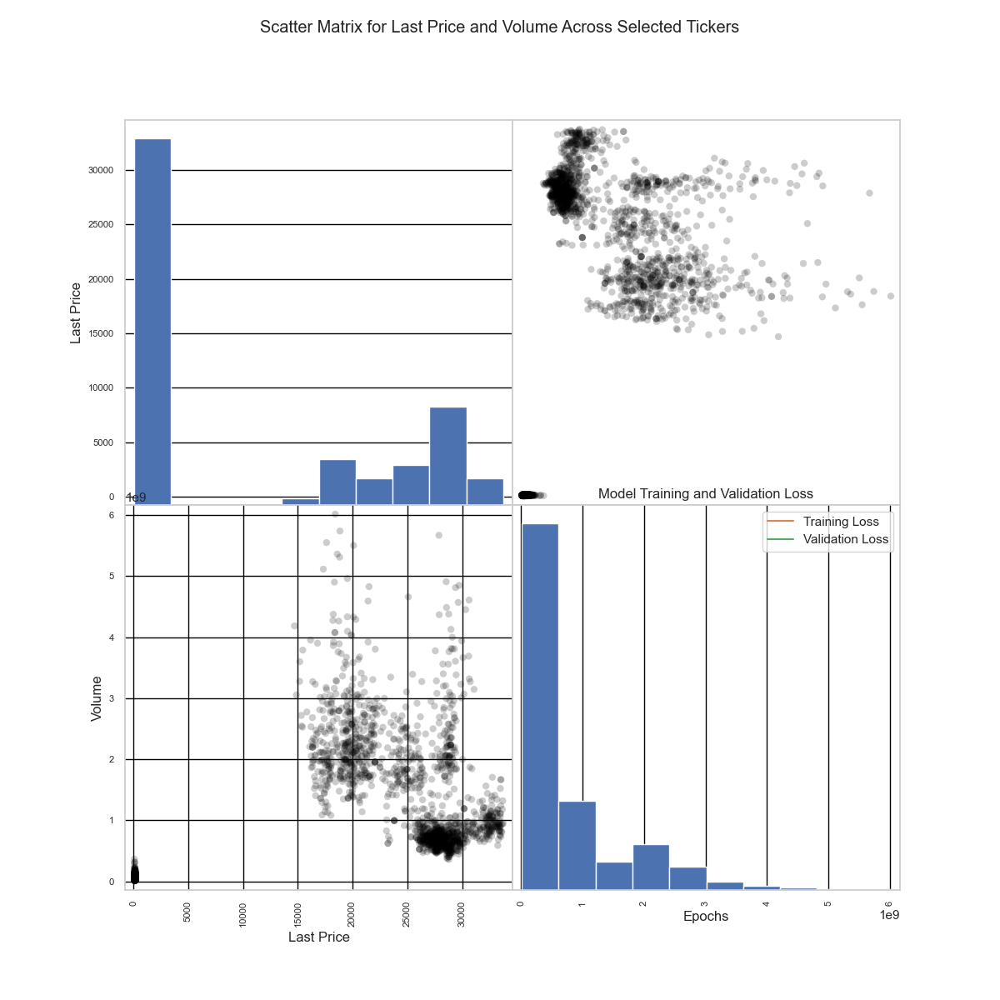

In [33]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Bidirectional, Dropout

# Define the model
def create_bi_lstm_model(input_shape):
    model = Sequential([
        Bidirectional(LSTM(50, return_sequences=True), input_shape=input_shape),
        Bidirectional(LSTM(50)),
        Dropout(0.2),
        Dense(1)  # Predicting the next value
    ])
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
    return model

# Assuming the third dimension is the number of features, e.g., 7
model = create_bi_lstm_model((60, 7))

# Model summary
model.summary()

# Fit the model
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1)

# Optionally, plot the training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


#### <u>**BI-LSTM MODEL EVALUATION**</center>

In [34]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Generate predictions
y_pred = model.predict(X_test)

# Calculate MSE
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error (MSE):", mse)

# Calculate RMSE
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)

# Calculate MAE
mae = mean_absolute_error(y_test, y_pred)
print("Mean Absolute Error (MAE):", mae)

# Calculate R-squared (R²)
r_squared = r2_score(y_test, y_pred)
print("R-squared (R²):", r_squared)


273/273 [==============================] - 2s 5ms/step
Mean Squared Error (MSE): 0.24031989093605066
Root Mean Squared Error (RMSE): 0.49022432715650766
Mean Absolute Error (MAE): 0.2585745678758573
R-squared (R²): 0.7484078107026857


#### <u>**PLOTTING THE LOSS CURVE**</center>

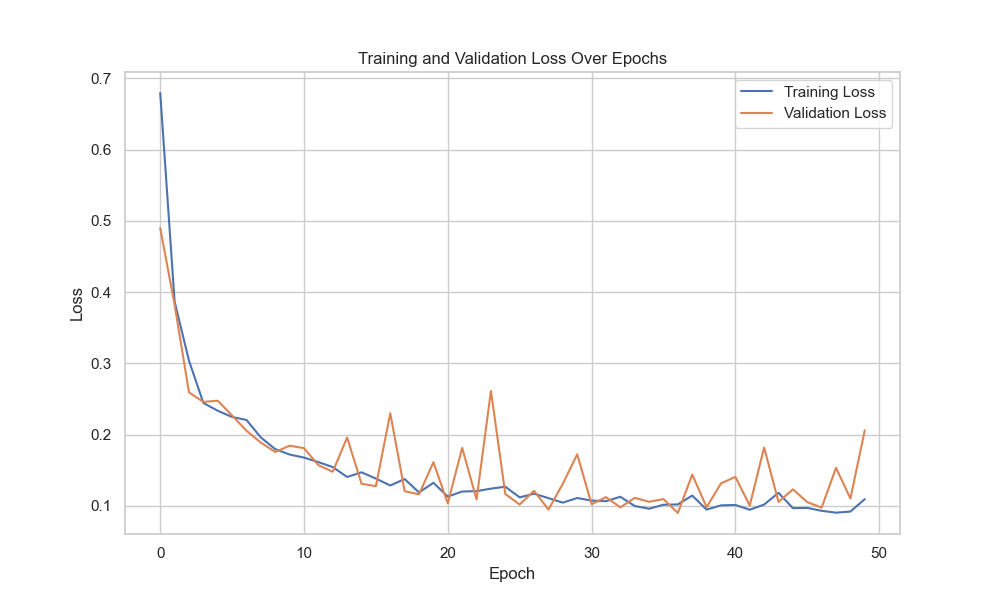

In [35]:
import matplotlib.pyplot as plt

# Assuming 'history' is the output from the model.fit() process
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


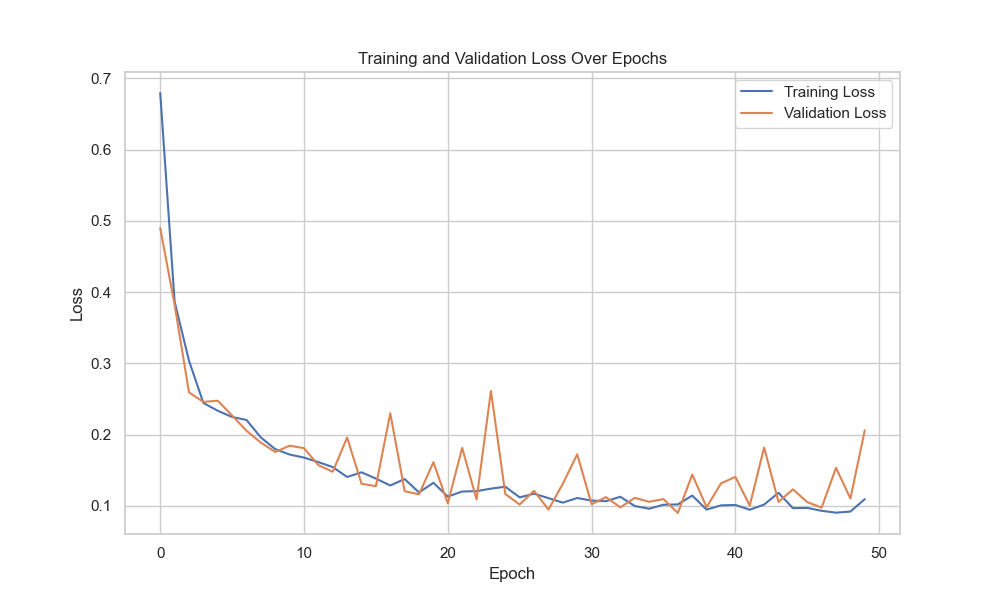

In [36]:
import matplotlib.pyplot as plt

# Assuming 'history' is the output from the model.fit() process
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


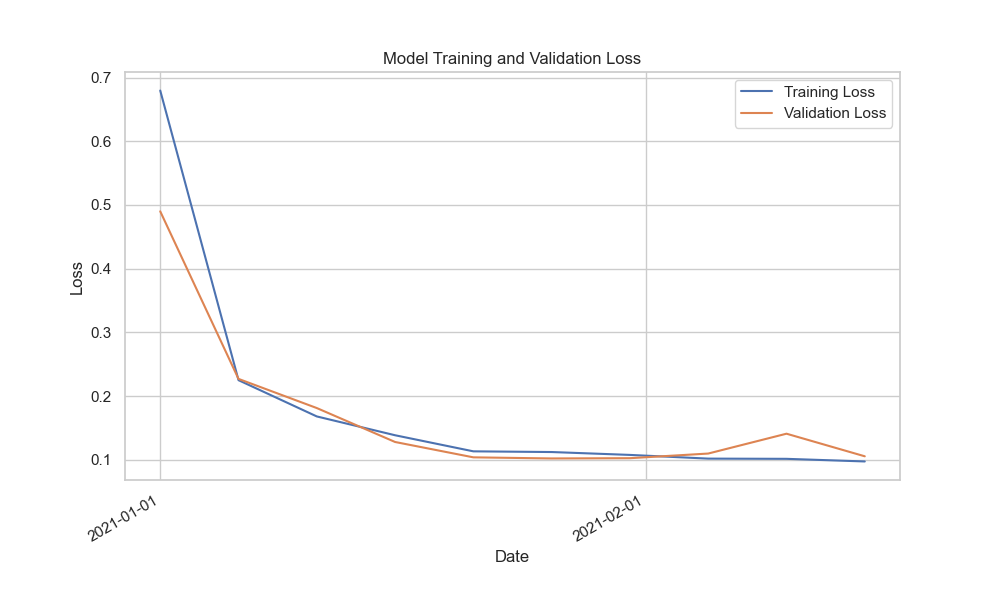

In [37]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

# Example: Create a date range for demonstration
date_index = pd.date_range(start='2021-01-01', periods=len(history.history['loss']), freq='D')

# Reduce the number of points to plot (e.g., take every 5th point)
reduced_indices = range(0, len(history.history['loss']), 5)

# Plot the training and validation loss with reduced points
plt.figure(figsize=(10, 6))
plt.plot(date_index[reduced_indices], [history.history['loss'][i] for i in reduced_indices], label='Training Loss')
plt.plot(date_index[reduced_indices], [history.history['val_loss'][i] for i in reduced_indices], label='Validation Loss')
plt.title('Model Training and Validation Loss')
plt.xlabel('Date')
plt.ylabel('Loss')
plt.legend()
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())  # Major ticks every month
plt.gca().xaxis.set_minor_locator(mdates.WeekdayLocator())  # Minor ticks every week
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))  # Format major ticks as dates
plt.gcf().autofmt_xdate()  # Auto format date labels
plt.show()


#### <u>**PLOTTING THE COMPARISON OF ACTUAL AND PREDICTED VALUES**</center>

273/273 [==============================] - 2s 6ms/step


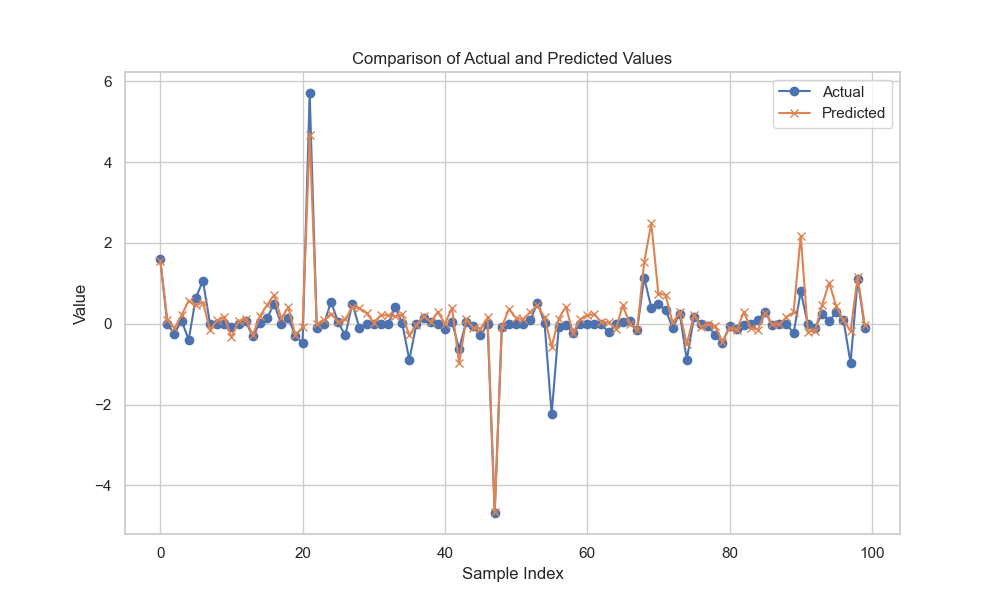

In [38]:
import matplotlib.pyplot as plt
import numpy as np

# Generate predictions for the test set
y_pred = model.predict(X_test)

# Plotting Prediction vs Actual for a subset of the data
plt.figure(figsize=(10, 6))
plt.plot(y_test[:100], label='Actual', marker='o')
plt.plot(y_pred[:100], label='Predicted', marker='x')
plt.title('Comparison of Actual and Predicted Values')
plt.xlabel('Sample Index')
plt.ylabel('Value')
plt.legend()
plt.grid(True)
plt.show()


#### <u>**PLOTTING THE COMPARISON BETWEEEN ACTUAL AND PREDICTED VALUES USING THE LINE PLOT**</center>

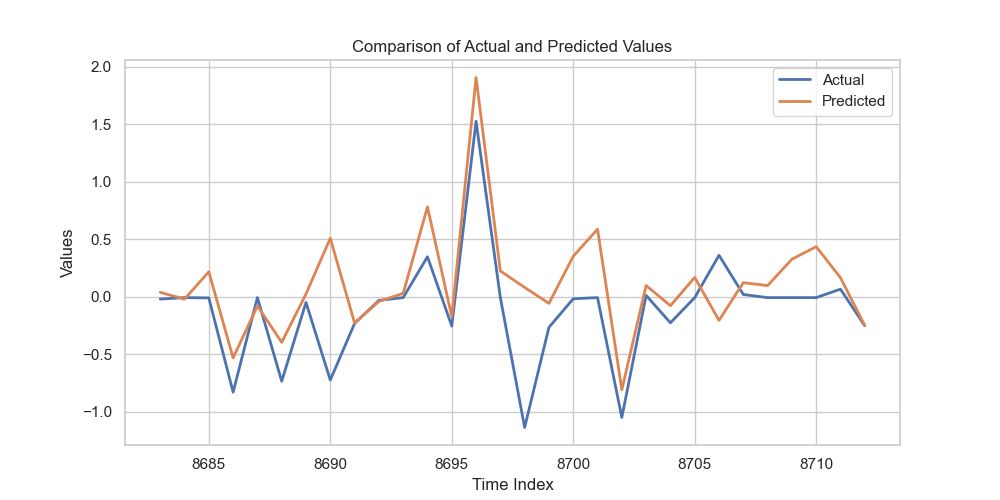

In [39]:
import matplotlib.pyplot as plt

# Select a specific subset for clearer visualization, e.g., 30 points
end = len(y_test)  # assuming y_test is defined and has enough entries
start = end - 30  # look at the last 30 points

plt.figure(figsize=(10, 5))
plt.plot(range(start, end), y_test[start:end], label='Actual', linestyle='-', linewidth=2)
plt.plot(range(start, end), y_pred[start:end], label='Predicted', linestyle='-', linewidth=2)
plt.title('Comparison of Actual and Predicted Values')
plt.xlabel('Time Index')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()


273/273 [==============================] - 1s 5ms/step


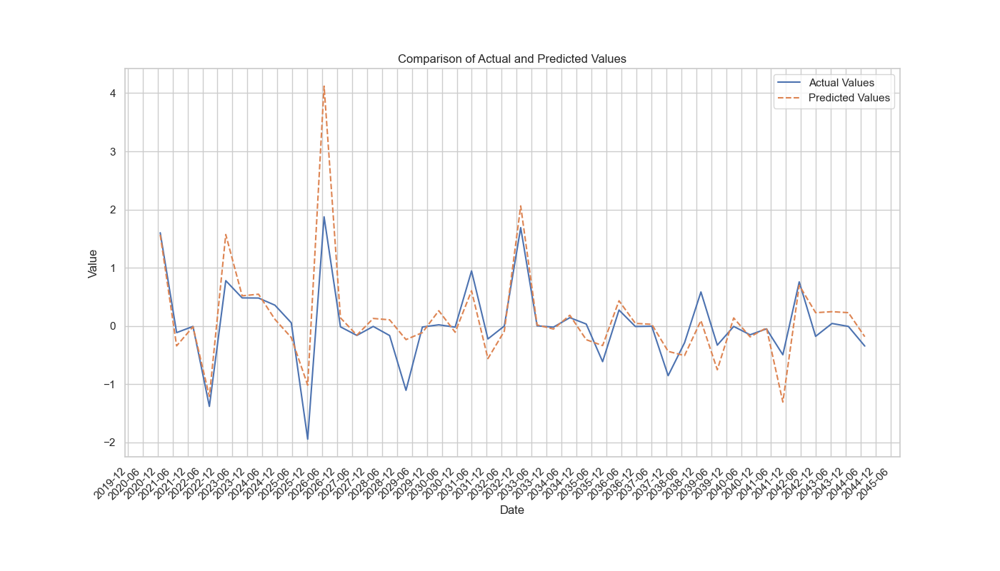

In [40]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

# Example: Create a date range for the test set
test_date_index = pd.date_range(start='2021-01-01', periods=len(y_test), freq='D')

# Reduce the number of points to plot (e.g., take every 200th point)
reduced_test_indices = range(0, len(y_test), 200)

# Predict values
y_pred = model.predict(X_test)

# Plot actual vs predicted values with reduced points
plt.figure(figsize=(14, 8))  # Increased figure size
plt.plot(test_date_index[reduced_test_indices], [y_test[i] for i in reduced_test_indices], label='Actual Values')
plt.plot(test_date_index[reduced_test_indices], [y_pred[i] for i in reduced_test_indices], linestyle='--', label='Predicted Values')
plt.title('Comparison of Actual and Predicted Values')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()

# Set larger interval for major ticks and format the dates
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=6))  # Major ticks every 6 months
plt.gca().xaxis.set_minor_locator(mdates.MonthLocator(interval=1))  # Minor ticks every month
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Format major ticks as dates in Year-Month format
plt.gcf().autofmt_xdate(rotation=45)  # Rotate date labels for better readability
plt.show()


#### <u>**RESHAPING INPUT DATA FOR SECOND TRAINING**</center>

In [41]:
import numpy as np

# Reshape the input data to include the sequence length
sequence_length = 60
num_features = X_train_scaled.shape[1]

# Ensure the data length is divisible by sequence_length for simplicity
num_sequences_train = len(X_train_scaled) // sequence_length
num_sequences_test = len(X_test_scaled) // sequence_length

# Reshape the data
X_train_reshaped = np.reshape(X_train_scaled[:num_sequences_train * sequence_length], (num_sequences_train, sequence_length, num_features))
X_test_reshaped = np.reshape(X_test_scaled[:num_sequences_test * sequence_length], (num_sequences_test, sequence_length, num_features))

# Reshape the target data accordingly
y_train_reshaped = y_train_scaled[:num_sequences_train * sequence_length].reshape(num_sequences_train, sequence_length)[:, -1]
y_test_reshaped = y_test_scaled[:num_sequences_test * sequence_length].reshape(num_sequences_test, sequence_length)[:, -1]


#### <u>**ADDING REGULARIZATION AND EARLY STOPPING**</center>

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_4 (Bidirecti  (None, 60, 100)           23200     
 onal)                                                           
                                                                 
 bidirectional_5 (Bidirecti  (None, 100)               60400     
 onal)                                                           
                                                                 
 dropout_2 (Dropout)         (None, 100)               0         
                                                                 
 dense_2 (Dense)             (None, 1)                 101       
                                                                 
Total params: 83701 (326.96 KB)
Trainable params: 83701 (326.96 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/100
15/1

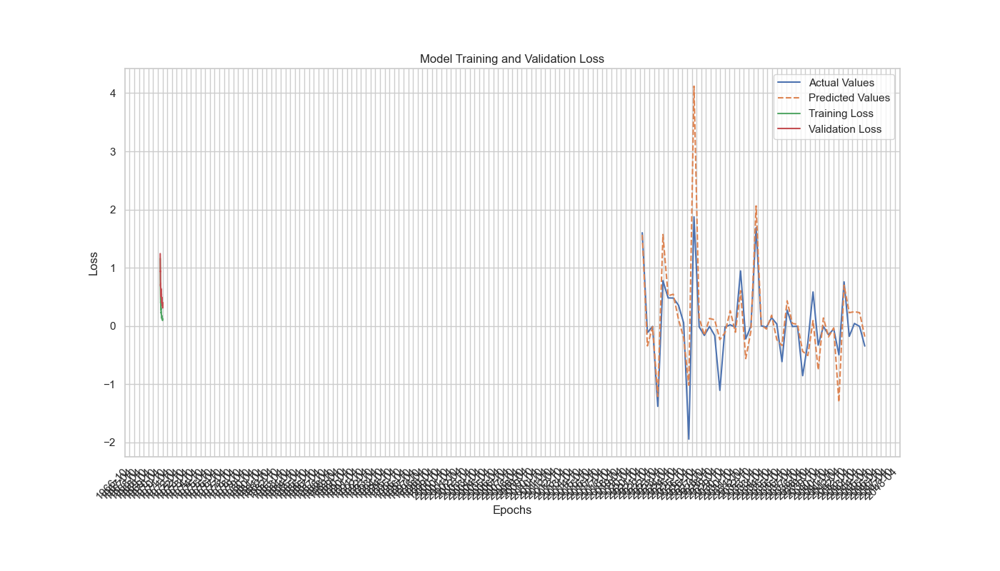

In [42]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Bidirectional, Dropout
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping

# Define the model with regularization
def create_bi_lstm_model(input_shape):
    model = Sequential([
        Bidirectional(LSTM(50, return_sequences=True, kernel_regularizer=l2(0.001)), input_shape=input_shape),
        Bidirectional(LSTM(50, kernel_regularizer=l2(0.001))),
        Dropout(0.5),  # Increased dropout rate
        Dense(1)  # Predicting the next value
    ])
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
    return model

# Assuming the third dimension is the number of features, e.g., 7
model = create_bi_lstm_model((sequence_length, num_features))

# Model summary
model.summary()

# Define early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Fit the model
history = model.fit(X_train_reshaped, y_train_reshaped, epochs=100, batch_size=32, validation_split=0.2, verbose=1, callbacks=[early_stopping])

# Optionally, plot the training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


#### <u>**MODEL EVALUATION SECOND TRAINING**</center>

In [43]:
from sklearn.metrics import mean_squared_error, r2_score, explained_variance_score
import numpy as np

# Evaluate the model on the test set
test_loss, test_mae = model.evaluate(X_test_reshaped, y_test_reshaped)
print(f'Test Loss: {test_loss}')
print(f'Test MAE: {test_mae}')

# Predict values
y_pred_reshaped = model.predict(X_test_reshaped)

# Inverse transform the predictions and test data to original scale
y_test_original = scaler_y.inverse_transform(y_test_reshaped.reshape(-1, 1)).flatten()
y_pred_original = scaler_y.inverse_transform(y_pred_reshaped.reshape(-1, 1)).flatten()

# Calculate additional metrics
epsilon = 1e-10  # Small constant to avoid division by zero
mse = mean_squared_error(y_test_original, y_pred_original)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred_original)
mape = np.mean(np.abs((y_test_original - y_pred_original) / (y_test_original + epsilon))) * 100
explained_var = explained_variance_score(y_test_original, y_pred_original)

# Calculate SMAPE
smape = 100 / len(y_test_original) * np.sum(2 * np.abs(y_pred_original - y_test_original) / (np.abs(y_test_original) + np.abs(y_pred_original) + epsilon))

print(f'Mean Squared Error (MSE): {mse}')
print(f'Root Mean Squared Error (RMSE): {rmse}')
print(f'R-squared (R²): {r2}')
print(f'Mean Absolute Percentage Error (MAPE): {mape}')
print(f'Explained Variance Score: {explained_var}')
print(f'Symmetric Mean Absolute Percentage Error (SMAPE): {smape}')


5/5 [==============================] - 0s 63ms/step - loss: 0.2485 - mae: 0.2812
Test Loss: 0.24848900735378265
Test MAE: 0.28122299909591675
5/5 [==============================] - 1s 5ms/step
Mean Squared Error (MSE): 87837.14716645303
Root Mean Squared Error (RMSE): 296.37332397915475
R-squared (R²): 0.7715719193467797
Mean Absolute Percentage Error (MAPE): 296.9241158257121
Explained Variance Score: 0.7737618305986687
Symmetric Mean Absolute Percentage Error (SMAPE): 55.52453176931211


#### <u>**PLOTTING MODEL EVALUATION FOR SECODN TRAINING**</center>

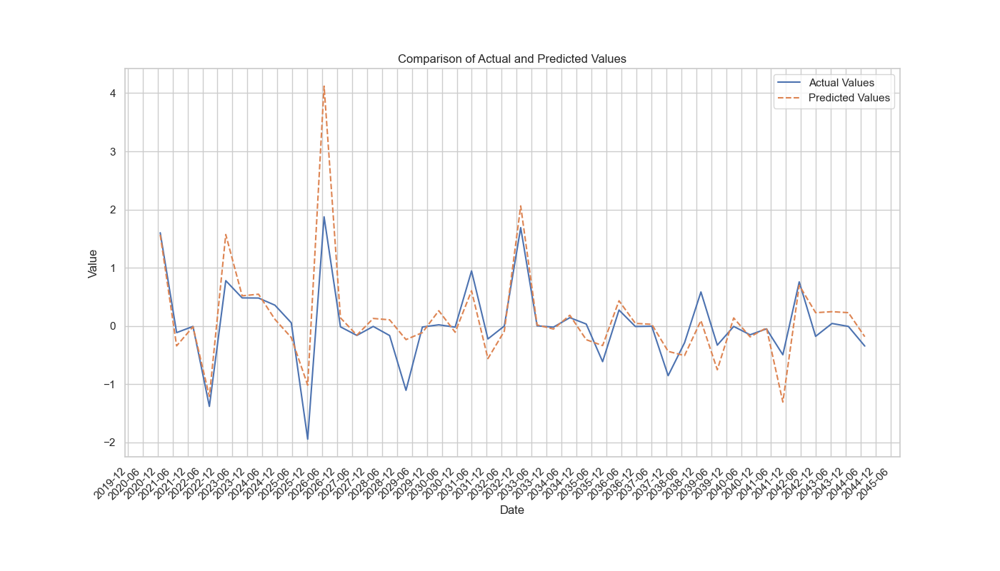

In [44]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

# Example: Create a date range for the test set
test_date_index = pd.date_range(start='2021-01-01', periods=len(y_test), freq='D')

# Reduce the number of points to plot (e.g., take every 200th point)
reduced_test_indices = range(0, len(y_test), 200)

# Plot actual vs predicted values with reduced points for better readability
plt.figure(figsize=(14, 8))
plt.plot(test_date_index[reduced_test_indices], [y_test[i] for i in reduced_test_indices], label='Actual Values')
plt.plot(test_date_index[reduced_test_indices], [y_pred[i] for i in reduced_test_indices], linestyle='--', label='Predicted Values')
plt.title('Comparison of Actual and Predicted Values')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()

# Manually set date ticks to avoid too many ticks
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=6))  # Major ticks every 6 months
plt.gca().xaxis.set_minor_locator(mdates.MonthLocator(interval=1))  # Minor ticks every month
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Format major ticks as dates in Year-Month format
plt.gcf().autofmt_xdate(rotation=45)  # Rotate date labels for better readability
plt.show()


#### <u>**CUSTOM EARLY CALL BACK**</center>

In [45]:
from tensorflow.keras.callbacks import Callback

class CustomEarlyStopping(Callback):
    def __init__(self, patience=0, restore_best_weights=False):
        super(CustomEarlyStopping, self).__init__()
        self.patience = patience
        self.restore_best_weights = restore_best_weights
        self.best_weights = None

    def on_train_begin(self, logs=None):
        self.wait = 0
        self.stopped_epoch = 0
        self.best = float('inf')

    def on_epoch_end(self, epoch, logs=None):
        current = logs.get('val_loss')
        if current is None:
            return
        
        if np.less(current, self.best):
            self.best = current
            self.wait = 0
            if self.restore_best_weights:
                self.best_weights = self.model.get_weights()
        else:
            self.wait += 1
            if self.wait >= self.patience:
                self.stopped_epoch = epoch
                self.model.stop_training = True
                if self.restore_best_weights:
                    self.model.set_weights(self.best_weights)
                    
    def on_train_end(self, logs=None):
        if self.stopped_epoch > 0:
            print(f'Early stopping at epoch {self.stopped_epoch}')


#### <u>**DEFINING THE HYPERPARAMETER TUNNING**</center>

In [46]:
import keras_tuner as kt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Bidirectional, Dropout
from tensorflow.keras.regularizers import l2

def build_model(hp):
    model = Sequential()
    model.add(Bidirectional(LSTM(
        units=hp.Int('units1', min_value=32, max_value=128, step=32),
        return_sequences=True,
        kernel_regularizer=l2(hp.Choice('l2_1', [0.001, 0.01, 0.1]))),
        input_shape=(sequence_length, num_features)))
    model.add(Bidirectional(LSTM(
        units=hp.Int('units2', min_value=32, max_value=128, step=32),
        kernel_regularizer=l2(hp.Choice('l2_2', [0.001, 0.01, 0.1])))))
    model.add(Dropout(hp.Float('dropout', 0.2, 0.5, step=0.1)))
    model.add(Dense(1))
    
    model.compile(
        optimizer='adam',
        loss='mean_squared_error',
        metrics=['mae'])
    
    return model


ModuleNotFoundError: No module named 'keras_tuner'

#### <u>**CREATE TUNNER**</center>

In [ ]:
tuner = kt.RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=10,
    executions_per_trial=2,
    directory='my_dir',
    project_name='intro_to_kt')


#### <u>**RUN TUNNER**</center>

In [ ]:
tuner.search(X_train_reshaped, y_train_reshaped, epochs=100, validation_split=0.2)

# Get the best hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

print(f"""
The optimal number of units in the first LSTM layer is {best_hps.get('units1')} and the second LSTM layer is {best_hps.get('units2')}.
The optimal regularization for the first LSTM layer is {best_hps.get('l2_1')} and the second LSTM layer is {best_hps.get('l2_2')}.
The optimal dropout rate is {best_hps.get('dropout')}.
""")


#### <u>**FINAL MODEL TRAINING WITH EARLY STOPPING**</center>

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

# Build the model with the best hyperparameters
model = tuner.hypermodel.build(best_hps)

# Define early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the final model with early stopping
history = model.fit(X_train_reshaped, y_train_reshaped, epochs=100, validation_split=0.2, callbacks=[early_stopping])

# Evaluate the model on the test set
test_loss, test_mae = model.evaluate(X_test_reshaped, y_test_reshaped)
print(f'Test Loss: {test_loss}')
print(f'Test MAE: {test_mae}')


#### <u>**ADDITIONAL METRICS CALCULATION**</center>

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, explained_variance_score
import numpy as np

# Predict values
y_pred_reshaped = model.predict(X_test_reshaped)

# Inverse transform the predictions and test data to original scale
y_test_original = scaler_y.inverse_transform(y_test_reshaped.reshape(-1, 1)).flatten()
y_pred_original = scaler_y.inverse_transform(y_pred_reshaped.reshape(-1, 1)).flatten()

# Calculate additional metrics
epsilon = 1e-10  # Small constant to avoid division by zero
mse = mean_squared_error(y_test_original, y_pred_original)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred_original)
mape = np.mean(np.abs((y_test_original - y_pred_original) / (y_test_original + epsilon))) * 100
explained_var = explained_variance_score(y_test_original, y_pred_original)

# Calculate SMAPE
smape = 100 / len(y_test_original) * np.sum(2 * np.abs(y_pred_original - y_test_original) / (np.abs(y_test_original) + np.abs(y_pred_original) + epsilon))

print(f'Mean Squared Error (MSE): {mse}')
print(f'Root Mean Squared Error (RMSE): {rmse}')
print(f'R-squared (R²): {r2}')
print(f'Mean Absolute Percentage Error (MAPE): {mape}')
print(f'Explained Variance Score: {explained_var}')
print(f'Symmetric Mean Absolute Percentage Error (SMAPE): {smape}')


#### <u>**PLOTTING MODEL AFTER HYPERPARAMETER TUNNING**</center>

In [ ]:
import matplotlib.pyplot as plt

# Reduce the number of points to plot (e.g., take every 10th point for clarity)
reduced_test_indices = range(0, len(y_test_original), 10)

# Plot actual vs predicted values with reduced points for better readability
plt.figure(figsize=(14, 8))
plt.plot(reduced_test_indices, [y_test_original[i] for i in reduced_test_indices], label='Actual Values', marker='o', linestyle='-')
plt.plot(reduced_test_indices, [y_pred_original[i] for i in reduced_test_indices], linestyle='--', label='Predicted Values', marker='x')
plt.title('Comparison of Actual and Predicted Values')
plt.xlabel('Index')
plt.ylabel('Value')
plt.legend()
plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Ensure 'Dates' column in the original dataframe is in datetime format
cleaned_data['Dates'] = pd.to_datetime(cleaned_data['Dates'])

# Extract the unique dates from the original dataframe
unique_dates = cleaned_data['Dates'].drop_duplicates()

# Extract the last test_set_length unique dates
test_set_length = len(y_test_original)
test_dates_aligned = unique_dates.iloc[-test_set_length:]

# Verify the lengths of all arrays
print(f'Length of test_dates_aligned: {len(test_dates_aligned)}')
print(f'Length of y_test_original: {len(y_test_original)}')
print(f'Length of y_pred_original: {len(y_pred_original)}')

# Print some samples from each to check if data aligns
print(f'Sample of test_dates_aligned: {test_dates_aligned[:10]}')
print(f'Sample of y_test_original: {y_test_original[:10]}')
print(f'Sample of y_pred_original: {y_pred_original[:10]}')

# Ensure that lengths match
assert len(test_dates_aligned) == len(y_test_original) == len(y_pred_original), "Lengths do not match!"

# Simplified plot to ensure it shows up
plt.figure(figsize=(14, 8))
plt.plot(test_dates_aligned, y_test_original, label='Actual Values')
plt.plot(test_dates_aligned, y_pred_original, label='Predicted Values', linestyle='--')
plt.title('Comparison of Actual and Predicted Values')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()

# Format date ticks
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))  # Major ticks every month
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Format major ticks as dates in Year-Month format
plt.gcf().autofmt_xdate(rotation=45)  # Rotate date labels for better readability

# Show the plot
plt.show()


#### <u>**MONTHLY AVERAGE PLOT**</center>

In [ ]:
# Ensure 'Dates' column in the original dataframe is in datetime format
cleaned_data['Dates'] = pd.to_datetime(cleaned_data['Dates'])

# Extract the unique dates from the original dataframe
unique_dates = cleaned_data['Dates'].drop_duplicates()

# Extract the last test_set_length unique dates
test_set_length = len(y_test_original)
test_dates_aligned = unique_dates.iloc[-test_set_length:]

# Create a DataFrame to align dates with actual and predicted values
results_df = pd.DataFrame({
    'Date': test_dates_aligned,
    'Actual': y_test_original,
    'Predicted': y_pred_original
})

# Aggregate by month
results_df.set_index('Date', inplace=True)
monthly_results = results_df.resample('M').mean()

# Plotting the aggregated data
plt.figure(figsize=(14, 8))
plt.plot(monthly_results.index, monthly_results['Actual'], label='Actual Values')
plt.plot(monthly_results.index, monthly_results['Predicted'], label='Predicted Values', linestyle='--')
plt.title('Comparison of Actual and Predicted Values (Monthly Average)')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()

# Format date ticks
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))  # Major ticks every month
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Format major ticks as dates in Year-Month format
plt.gcf().autofmt_xdate(rotation=45)  # Rotate date labels for better readability

# Show the plot
plt.show()


#### <u>**CALCULATING AND PLOTTING RESIDUALS**</center>

In [ ]:
# Calculate residuals
residuals = y_test_original - y_pred_original

# Plot residuals
plt.figure(figsize=(14, 8))
plt.plot(test_dates_aligned, residuals, marker='o', linestyle='-', markersize=2, label='Residuals')
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residuals of the Model')
plt.xlabel('Date')
plt.ylabel('Residuals')
plt.legend()
plt.show()


#### <u>**RESIDUAL NORMALITY CHECKS**</center>

In [ ]:
import scipy.stats as stats

# Plotting the histogram of residuals
plt.figure(figsize=(12, 6))
plt.hist(residuals, bins=30, edgecolor='k', alpha=0.7)
plt.title('Histogram of Residuals')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()

# Plotting the Q-Q plot of residuals
plt.figure(figsize=(12, 6))
stats.probplot(residuals, dist="norm", plot=plt)
plt.title('Q-Q Plot of Residuals')
plt.show()


#### <u>**AUTO CORRELATION CHECKS**</center>

In [ ]:
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Plot ACF
fig, ax = plt.subplots(2, 1, figsize=(12, 8))

# Autocorrelation function
sm.graphics.tsa.plot_acf(residuals, lags=40, ax=ax[0])
ax[0].set_title('Autocorrelation Function (ACF)')

# Partial Autocorrelation function
sm.graphics.tsa.plot_pacf(residuals, lags=40, ax=ax[1])
ax[1].set_title('Partial Autocorrelation Function (PACF)')

plt.tight_layout()
plt.show()


#### <u>**SAVE THE MODEL**</center>

In [ ]:
# Save the entire model in Keras format
model.save('bi_lstm_model.keras')